<center><h1>Wang_Timothy_HW6</h1></center>

Name: Timothy Wang
<br>
Github Username: timothyswang
<br>
USC ID: 2697040790

## 1. Tree-Based Methods

Import packages

In [100]:
import os
import pandas as pd
import numpy as np
import seaborn

import sklearn
import sklearn.ensemble
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut

import matplotlib.pyplot as plt
import xgboost as xgb
import imblearn
from imblearn.over_sampling import SMOTE

### (a) Download the APS Failure data

In [36]:
#[1]
train_aps = pd.read_excel("../data/aps_failure_training_set.xlsx")

print(train_aps)

      class  aa_000 ab_000      ac_000 ad_000 ae_000 af_000 ag_000 ag_001   
0       neg   76698     na  2130706438    280      0      0      0      0  \
1       neg   33058     na           0     na      0      0      0      0   
2       neg   41040     na         228    100      0      0      0      0   
3       neg      12      0          70     66      0     10      0      0   
4       neg   60874     na        1368    458      0      0      0      0   
...     ...     ...    ...         ...    ...    ...    ...    ...    ...   
59995   neg  153002     na         664    186      0      0      0      0   
59996   neg    2286     na  2130706538    224      0      0      0      0   
59997   neg     112      0  2130706432     18      0      0      0      0   
59998   neg   80292     na  2130706432    494      0      0      0      0   
59999   neg   40222     na         698    628      0      0      0      0   

      ag_002  ...   ee_002  ee_003   ee_004   ee_005   ee_006  ee_007  ee_0

In [37]:
#[1]
test_aps = pd.read_csv("../data/aps_failure_test_set.csv")

print(test_aps)

      class  aa_000 ab_000      ac_000 ad_000 ae_000 af_000 ag_000 ag_001   
0       neg      60      0          20     12      0      0      0      0  \
1       neg      82      0          68     40      0      0      0      0   
2       neg   66002      2         212    112      0      0      0      0   
3       neg   59816     na        1010    936      0      0      0      0   
4       neg    1814     na         156    140      0      0      0      0   
...     ...     ...    ...         ...    ...    ...    ...    ...    ...   
15995   neg   81852     na  2130706432    892      0      0      0      0   
15996   neg      18      0          52     46      8     26      0      0   
15997   neg   79636     na        1670   1518      0      0      0      0   
15998   neg     110     na          36     32      0      0      0      0   
15999   neg       8      0           6      4      2      2      0      0   

      ag_002  ...  ee_002  ee_003  ee_004  ee_005   ee_006  ee_007  ee_008 

### (b) Data Preparation

#### (i) Research what types of techniques are usually used

[2]
Some common data imputation techniques include:
- Using a distinct value (such as "0") for any feature with a missing value
- Replacing the value with a value from a randomly selected other observation that has a value for the missing feature
- Use a statistic such as mean, median, or mode of the feature from the other observations to replace the missing feature
- Use a predictive model such as KNN or linear regression to compute the missing feature
- Use an iterative method where you set all missing values to a mean or mode, and then you compute missing values using other data points, and then you repeat that step

[3]
Other common data imputation techniques include:
- Using "Multivariate Imputation by Chained Equation" (MICE). This method fills missing datapoints multiple times. This method can handle different data types (binary data vs continuous values for instance)
- Deep Learning -- use neural networks to help fill in the missing datapoints

For this dataset, I will use the method that replaces the missing data values with the mean of that feature across all the observations.

In [38]:
#[20]
train_aps.loc[train_aps["class"] == "neg", "class"] = 0
train_aps.loc[train_aps["class"] == "pos", "class"] = 1

test_aps.loc[test_aps["class"] == "neg", "class"] = 0
test_aps.loc[test_aps["class"] == "pos", "class"] = 1

#[21]
train_aps["class"] = train_aps["class"].astype("int64")
test_aps["class"] = test_aps["class"].astype("int64")

#[4]
train_y = train_aps["class"]
train_x = train_aps.drop(["class"], axis=1)
#[4]
test_y = test_aps["class"]
test_x = test_aps.drop(["class"], axis=1)

#[5]
train_x = train_x.replace("na", None)
test_x = test_x.replace("na", None)

#[6]
train_x = train_x.astype(float)
test_x = test_x.astype(float)

#[7]
train_x = train_x.fillna(train_x.mean())
test_x = test_x.fillna(test_x.mean())

print(train_x)

         aa_000    ab_000        ac_000         ad_000  ae_000  af_000   
0       76698.0  0.713189  2.130706e+09     280.000000     0.0     0.0  \
1       33058.0  0.713189  0.000000e+00  190620.639314     0.0     0.0   
2       41040.0  0.713189  2.280000e+02     100.000000     0.0     0.0   
3          12.0  0.000000  7.000000e+01      66.000000     0.0    10.0   
4       60874.0  0.713189  1.368000e+03     458.000000     0.0     0.0   
...         ...       ...           ...            ...     ...     ...   
59995  153002.0  0.713189  6.640000e+02     186.000000     0.0     0.0   
59996    2286.0  0.713189  2.130707e+09     224.000000     0.0     0.0   
59997     112.0  0.000000  2.130706e+09      18.000000     0.0     0.0   
59998   80292.0  0.713189  2.130706e+09     494.000000     0.0     0.0   
59999   40222.0  0.713189  6.980000e+02     628.000000     0.0     0.0   

       ag_000  ag_001  ag_002  ag_003  ...     ee_002    ee_003     ee_004   
0         0.0     0.0     0.0    

#### (ii) Calculate the coefficient of variation

In [39]:
#Train Data
#[8] #[9]
cv_calc = lambda input: np.std(input, ddof=1)/np.mean(input)
train_cv = train_x.apply(cv_calc)

print(train_cv)

aa_000      2.450938
ab_000      2.328400
ac_000      2.169767
ad_000    183.847620
ae_000     23.190937
             ...    
ee_007      4.962483
ee_008      3.222010
ee_009      5.626979
ef_000     47.124953
eg_000     40.553250
Length: 170, dtype: float64


In [40]:
#Test Data
#[8] #[9]
cv_calc = lambda input: np.std(input, ddof=1)/np.mean(input)
test_cv = test_x.apply(cv_calc)

print(test_cv)

aa_000     7.405254
ab_000     1.598753
ac_000     2.159811
ad_000     3.059255
ae_000    17.984377
            ...    
ee_007     4.593464
ee_008     3.698411
ee_009     6.188841
ef_000    50.690401
eg_000    57.661381
Length: 170, dtype: float64


#### (iii) Plot a correlation matrix

In [41]:
#Train Data

#[10]
train_corr_matrix = train_x.corr()
print(train_corr_matrix)

#[11]
train_corr_matrix.to_excel("train_corr_matrix.xlsx")

#Note -- See train_corr_matrix.xlsx (in the notebook directory) for the full correlation matrix for the training data.

          aa_000    ab_000    ac_000    ad_000    ae_000    af_000    ag_000   
aa_000  1.000000  0.029905 -0.020777 -0.001110  0.046259  0.066789  0.018541  \
ab_000  0.029905  1.000000 -0.009774  0.000068  0.028885  0.044009  0.000588   
ac_000 -0.020777 -0.009774  1.000000 -0.002285 -0.004944 -0.010270  0.017524   
ad_000 -0.001110  0.000068 -0.002285  1.000000 -0.000209 -0.000257 -0.000047   
ae_000  0.046259  0.028885 -0.004944 -0.000209  1.000000  0.823108 -0.000428   
...          ...       ...       ...       ...       ...       ...       ...   
ee_007  0.603875  0.011406 -0.019008 -0.000518  0.037821  0.050743  0.000307   
ee_008  0.469873  0.002352  0.011781 -0.000932 -0.008457 -0.010884 -0.000823   
ee_009  0.247075  0.000619  0.019416 -0.000578 -0.006774 -0.008442 -0.001230   
ef_000  0.014128  0.051710 -0.006165 -0.000095  0.070835  0.106271 -0.000072   
eg_000  0.026386  0.104345  0.014228 -0.000114  0.041685  0.060705  0.000244   

          ag_001    ag_002    ag_003  .

In [42]:
#Test Data

#[10]
test_corr_matrix = test_x.corr()
print(test_corr_matrix)

#[11]
test_corr_matrix.to_excel("test_corr_matrix.xlsx")

#Note -- See test_corr_matrix.xlsx (in the notebook directory) for the full correlation matrix for the test data.

          aa_000    ab_000    ac_000    ad_000    ae_000    af_000    ag_000   
aa_000  1.000000  0.019444 -0.006617  0.031419  0.015167  0.017624  0.019825  \
ab_000  0.019444  1.000000 -0.017045  0.062086 -0.002536  0.038966  0.000855   
ac_000 -0.006617 -0.017045  1.000000  0.045770 -0.004066 -0.012439  0.002336   
ad_000  0.031419  0.062086  0.045770  1.000000  0.013300  0.027942  0.004724   
ae_000  0.015167 -0.002536 -0.004066  0.013300  1.000000  0.876924 -0.000844   
...          ...       ...       ...       ...       ...       ...       ...   
ee_007  0.240724  0.025504 -0.017161  0.039219  0.031079  0.025743  0.104795   
ee_008  0.140579  0.002632  0.006316  0.035682 -0.008903 -0.011336  0.009131   
ee_009  0.067196  0.000027  0.010281  0.029120 -0.008270 -0.009309 -0.000612   
ef_000  0.000891  0.015675 -0.006485  0.008687  0.015457  0.015409 -0.000276   
eg_000  0.000810  0.004462  0.020807  0.003544  0.004222  0.005449 -0.000243   

          ag_001    ag_002    ag_003  .

<Axes: >

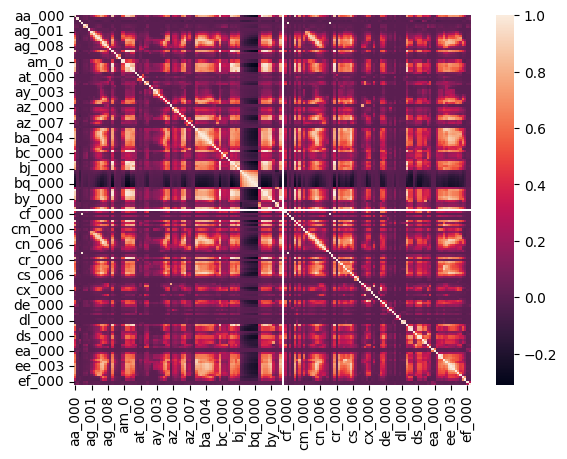

In [43]:
#[12] 
#Training Data
seaborn.heatmap(train_corr_matrix)

<Axes: >

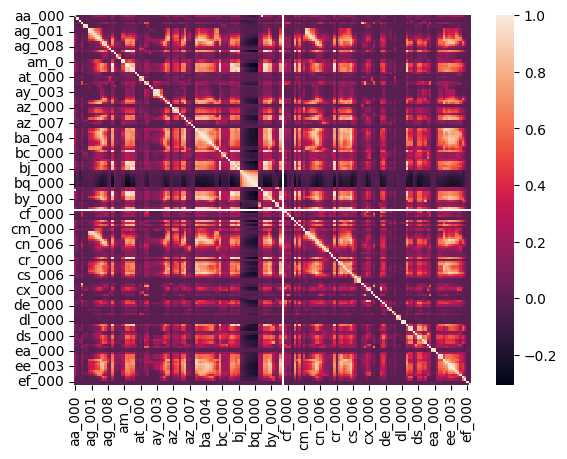

In [44]:
#[12] 
#Test Data
seaborn.heatmap(test_corr_matrix)

#### (iv) Make scatter plots and box plots

In [45]:
#Square root of 170 is 13.0384048104.
# So we pick 13 features.
#[13]
train_largest_cv = train_cv.nlargest(n=13)
print(train_largest_cv)

cs_009    235.277605
cf_000    184.233092
co_000    183.949017
ad_000    183.847620
dh_000    114.984991
dj_000    109.647285
ag_000     91.878565
as_000     86.416904
ay_009     83.786063
az_009     76.967978
ak_000     74.526688
au_000     68.160554
ch_000     58.268229
dtype: float64


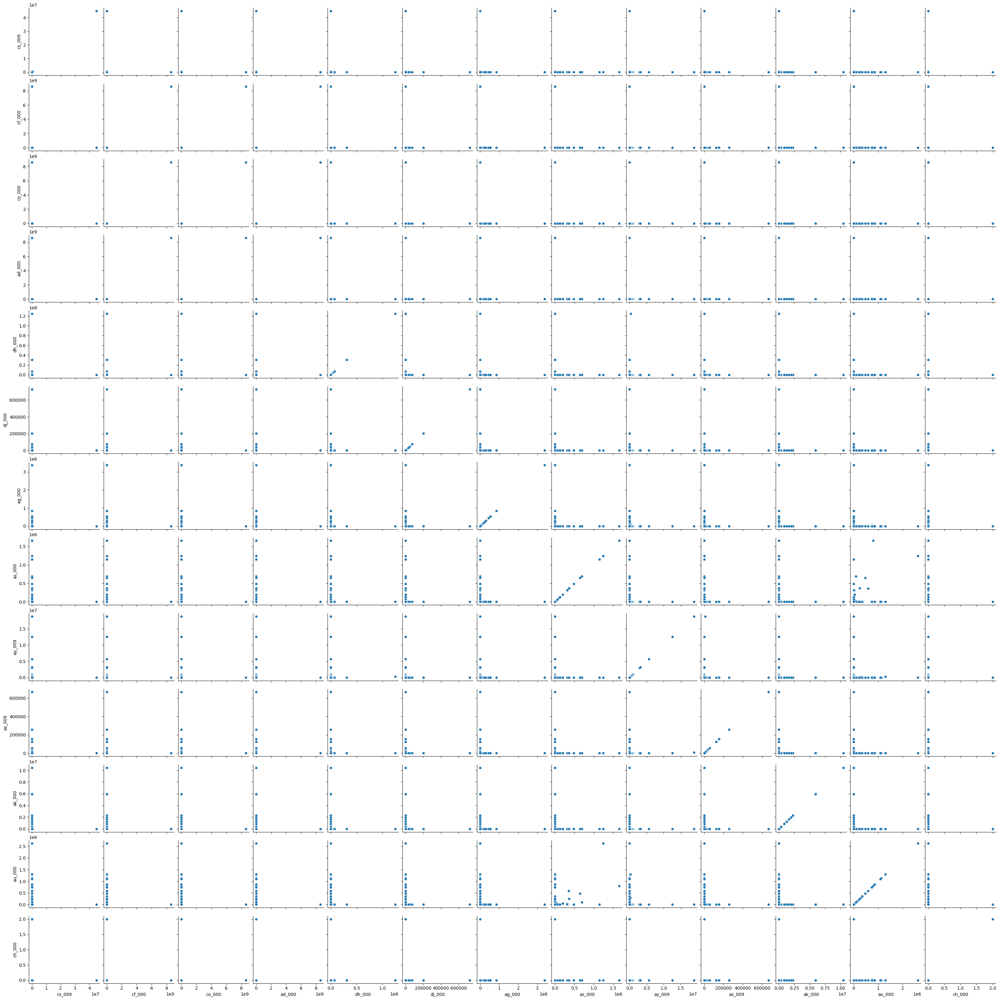

In [46]:
train_cv_plot = train_x[["cs_009", "cf_000", "co_000", "ad_000", "dh_000", "dj_000", "ag_000", "as_000", "ay_009", "az_009", "ak_000", "au_000", "ch_000"]]

#[14]
seaborn.pairplot(data=train_cv_plot, diag_kind=None)

<Axes: >

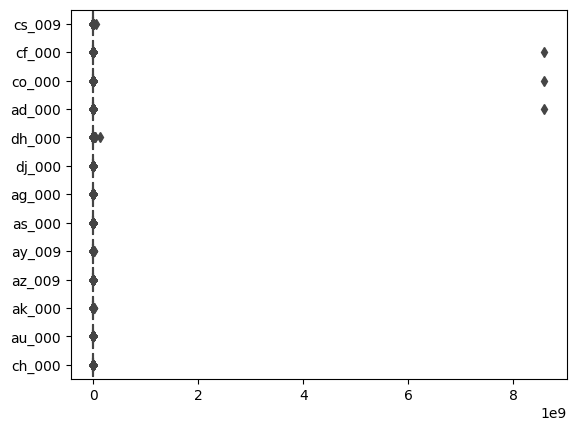

In [47]:
#[15]
seaborn.boxplot(data=train_cv_plot, orient="h")

Looking at the plots, it could be that the features au_000, ak_000, az_009, ay_009, and as_000 are relevant. This is because of how spread out the datapoints are -- they're not all bunched up near one value. This could suggest a wider amount of variance amongst the points, and thus, more of an impact on the class of the datapoint.

#### (v) Is this data set imbalanced?

In [107]:
#[16]
print("Number of pos values:", train_aps["class"].value_counts()[1] + test_aps["class"].value_counts()[1])
print("Number of neg values:", train_aps["class"].value_counts()[0] + test_aps["class"].value_counts()[0])

Number of pos values: 1375
Number of neg values: 74625


Yes, I would say that this dataset is very imbalanced. This is because there's about 54 times more negative datapoints than positive datapoints in all of the dataset.

### (c) Train a random forest

In [66]:
#[17]
imb_random_forest = sklearn.ensemble.RandomForestClassifier(oob_score=True).fit(X=train_x, y=train_y)

TRAINING SET CONFUSION MATRIX, ROC, AUC, ETC.

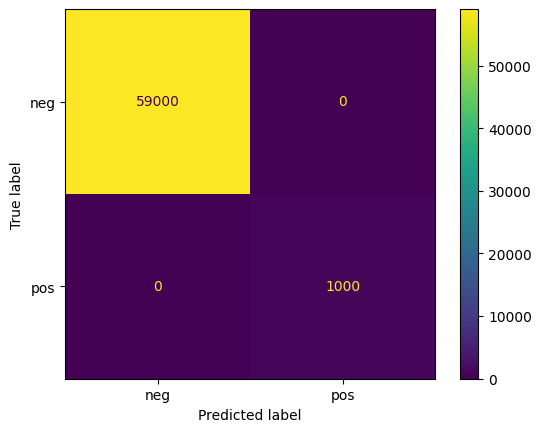

In [67]:
#[17]
imb_rf_train_pred_y = imb_random_forest.predict(X=train_x)

#[18]
imb_rf_train_cm = sklearn.metrics.confusion_matrix(y_true=train_y, y_pred=imb_rf_train_pred_y)

#[19]
imb_rf_train_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=imb_rf_train_cm, display_labels=["neg", "pos"])
imb_rf_train_cm_visual.plot()

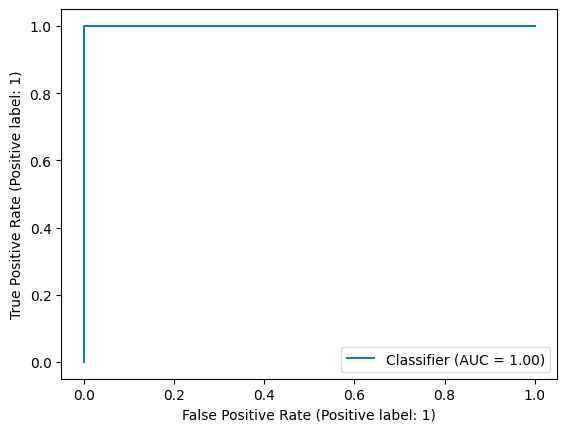

In [68]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=train_y, y_pred=imb_rf_train_pred_y)
plt.show()

In [69]:
#[22]
auc_x, auc_y, auc_extra = sklearn.metrics.roc_curve(train_y, imb_rf_train_pred_y, pos_label=1)
imb_rf_train_AUC = sklearn.metrics.auc(auc_x, auc_y)
print("AUC for the training data:", imb_rf_train_AUC)

AUC for the training data: 1.0


There were 0 misclassified datapoints in the training data. Misclassification percent of 0/60000 = 0.0 (0.0%)

TEST SET CONFUSION MATRIX, ROC, AUC, ETC.

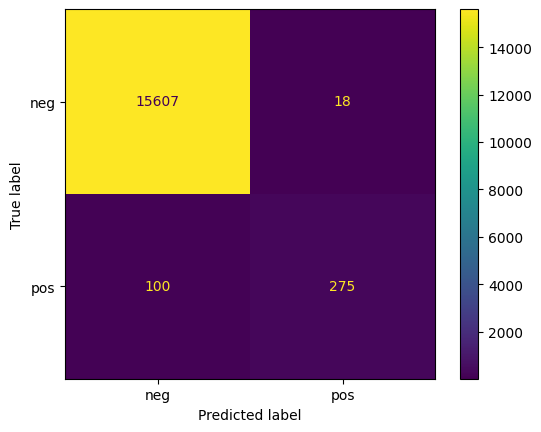

In [70]:
#[17]
imb_rf_test_pred_y = imb_random_forest.predict(X=test_x)

#[18]
imb_rf_test_cm = sklearn.metrics.confusion_matrix(y_true=test_y, y_pred=imb_rf_test_pred_y)

#[19]
imb_rf_test_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=imb_rf_test_cm, display_labels=["neg", "pos"])
imb_rf_test_cm_visual.plot()

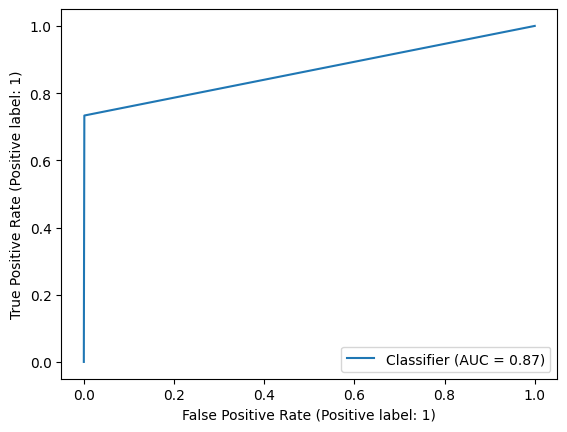

In [71]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=test_y, y_pred=imb_rf_test_pred_y)
plt.show()

In [72]:
#[22]
auc_x, auc_y, auc_extra = sklearn.metrics.roc_curve(test_y, imb_rf_test_pred_y, pos_label=1)
imb_rf_test_AUC = sklearn.metrics.auc(auc_x, auc_y)
print("AUC for the test data:", imb_rf_test_AUC)

AUC for the test data: 0.8660906666666667


There were 118 misclassified datapoints in the test dataset. (18 points classified as positive when really negative, 100 points classified as negative when really positive.) Misclassification percent of 118/15800 = 0.00746835443 (0.75%)

In [74]:
#[17]
print("Out of Box error estimate is:", 1.0 - imb_random_forest.oob_score_)

Out of Box error estimate is: 0.006116666666666659


The out of box error estimate (~0.61%) for this model is pretty close to the test error that I got (~0.75%). The actual test error was just a tad bit higher than the out of box error estimate.

### (d) Research class imbalance in random forest

Researching how class imbalances are handled in random forest, I learned that one common method is using class weighting to weight higher the less represented class, such that this minority class gets "overrepresented". This may cause some false positives for the majority class though. Variations of this include weighting by the inverse of the size of the class in the training data. Or weighting based on an individual bootstrap sample. Finally, one could also purposefully undersample the overrepresented class. [23] For the next step, I will use bootstrap class weighting.

In [75]:
#[17] [23]
bal_random_forest = sklearn.ensemble.RandomForestClassifier(oob_score=True, class_weight="balanced_subsample").fit(X=train_x, y=train_y)

TRAINING SET CONFUSION MATRIX, ROC, AUC, ETC.

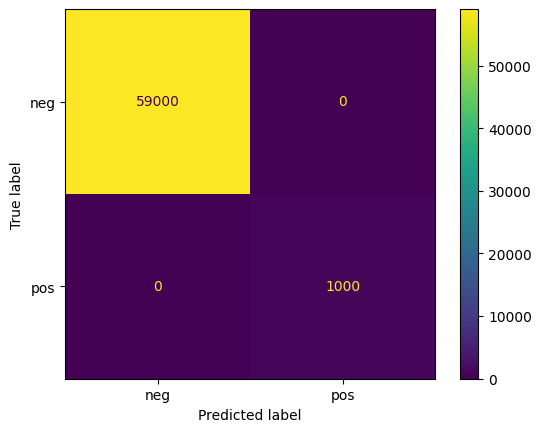

In [76]:
#[17]
bal_rf_train_pred_y = bal_random_forest.predict(X=train_x)

#[18]
bal_rf_train_cm = sklearn.metrics.confusion_matrix(y_true=train_y, y_pred=bal_rf_train_pred_y)

#[19]
bal_rf_train_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=bal_rf_train_cm, display_labels=["neg", "pos"])
bal_rf_train_cm_visual.plot()

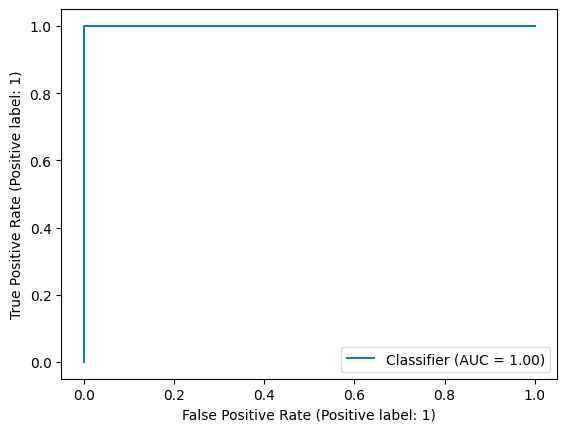

In [77]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=train_y, y_pred=bal_rf_train_pred_y)
plt.show()

In [78]:
#[22]
auc_x, auc_y, auc_extra = sklearn.metrics.roc_curve(train_y, bal_rf_train_pred_y, pos_label=1)
bal_rf_train_AUC = sklearn.metrics.auc(auc_x, auc_y)
print("AUC for the training data:", bal_rf_train_AUC)

AUC for the training data: 1.0


There were 0 misclassified datapoints in the training data. Misclassification percent of 0/60000 = 0.0 (0.0%)

TEST SET CONFUSION MATRIX, ROC, AUC, ETC.

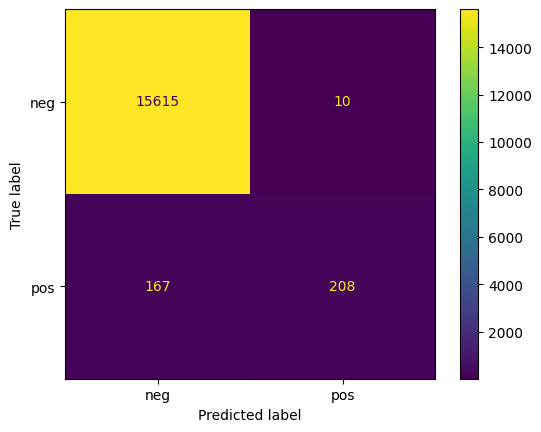

In [79]:
#[17]
bal_rf_test_pred_y = bal_random_forest.predict(X=test_x)

#[18]
bal_rf_test_cm = sklearn.metrics.confusion_matrix(y_true=test_y, y_pred=bal_rf_test_pred_y)

#[19]
bal_rf_test_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=bal_rf_test_cm, display_labels=["neg", "pos"])
bal_rf_test_cm_visual.plot()

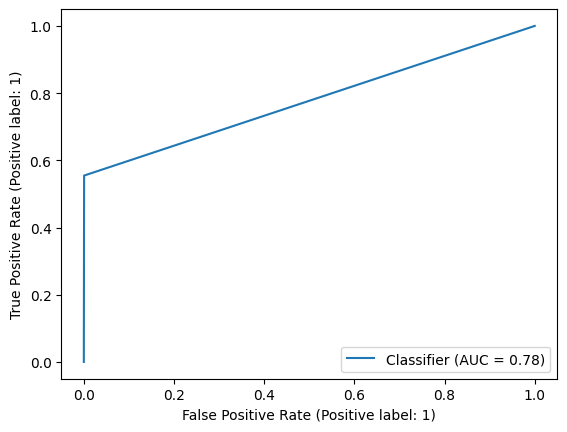

In [80]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=test_y, y_pred=bal_rf_test_pred_y)
plt.show()

In [81]:
#[22]
auc_x, auc_y, auc_extra = sklearn.metrics.roc_curve(test_y, bal_rf_test_pred_y, pos_label=1)
bal_rf_test_AUC = sklearn.metrics.auc(auc_x, auc_y)
print("AUC for the test data:", bal_rf_test_AUC)

AUC for the test data: 0.7770133333333333


There were 177 misclassified datapoints in the test dataset. (10 points classified as positive when really negative, 167 points classified as negative when really positive.) Misclassification percent of 167/15800 = 0.01056962025 (1.06%)

In [82]:
#[17]
print("Out of Box error estimate is:", 1.0 - bal_random_forest.oob_score_)

Out of Box error estimate is: 0.007783333333333364


The out of box error estimate (~0.78%) for this model is pretty close to the test error that I got (~1.06%). The actual test error was larger than the out of box error estimate by about .3 percentage points.

Comparing the balanced random forest results with the non-balanced random forest results, the non-balanced random forest did better (had a lower classification error). The balanced random forest error rate was about 1.06%, while the unbalanced random forest error rate was about 0.75%. Digging deeper, we can see that while the unbalanced random forest had a lot less false positives than the balanced random forest, it also had a lot more false negatives. This is likely due to how the minority class (positive cases) were weighted more strongly in the balanced random forest model.

### (e) XGBoost and Model Trees

In [92]:
#Possible alpha values:
boosting_alpha_values = [1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75]

boosting_accuracy_array = []
for this_alpha_value in boosting_alpha_values:
    #[24]
    this_alpha_model = xgb.XGBClassifier(reg_alpha=this_alpha_value)
    #[25]
    this_alpha_scores = cross_val_score(estimator=this_alpha_model, X=train_x, y=train_y, cv=5)

    boosting_accuracy_array.append(this_alpha_scores.mean())

print(boosting_accuracy_array)
print(np.max(boosting_accuracy_array))
print(np.argmax(boosting_accuracy_array))

[0.9945333333333334, 0.9945, 0.9943, 0.9945999999999999, 0.9944833333333334, 0.9944833333333334, 0.9943]
0.9945999999999999
3


Cross Validation Results:

Alpha - Score

0.25 -- 0.9945166666666667

0.5 -- 0.9945666666666668

0.75 -- 0.9944666666666666

1.0 -- 0.9940666666666667

2.0 -- 0.9945999999999999

3.0 -- 0.9944166666666667

4.0 -- 0.9944166666666666

1.25 -- 0.9945333333333334

1.5 -- 0.9945

1.75 -- 0.9943

2.25 -- 0.9944833333333334

2.5 -- 0.9944833333333334

2.75 -- 0.9943

I'm going to choose an alpha value of 2.0, as it had the highest cross validation score.

In [110]:
#[24]
xgb_boost_model = xgb.XGBClassifier(reg_alpha=2.0)
#[25]
xgb_five_cv = cross_val_score(estimator=xgb_boost_model, X=train_x, y=train_y, cv=5)
xgb_ten_cv = cross_val_score(estimator=xgb_boost_model, X=train_x, y=train_y, cv=10)
#[26]
reduced_train_x = train_x.sample(n=2000)
reduced_train_y = train_y.sample(n=2000)
#[27]
xgb_loo_cv = cross_val_score(estimator=xgb_boost_model, X=reduced_train_x, y=reduced_train_y, cv=LeaveOneOut(), n_jobs=-1)

print("Five k-fold:", xgb_five_cv.mean())
print("Ten k-fold:", xgb_ten_cv.mean())
print("Leave One Out CV:", xgb_loo_cv.mean())

Five k-fold: 0.9945999999999999
Ten k-fold: 0.9945833333333333
Leave One Out CV: 0.986


Train Error Estimates:

Five Fold: 0.0054 (0.54%)

Ten Fold: 0.00541666666 (0.54%)

Leave One Out: 0.014 (1.4%)

In [94]:
#[24]
xgb_train_model = xgb_boost_model.fit(X=train_x, y=train_y)
xgb_train_predict_y = xgb_train_model.predict(X=train_x)
#[24]
xgb_test_model = xgb_boost_model.fit(X=train_x, y=train_y)
xgb_test_predict_y = xgb_test_model.predict(X=test_x)

TRAIN CONFUSION MATRIX, ROC, AUC

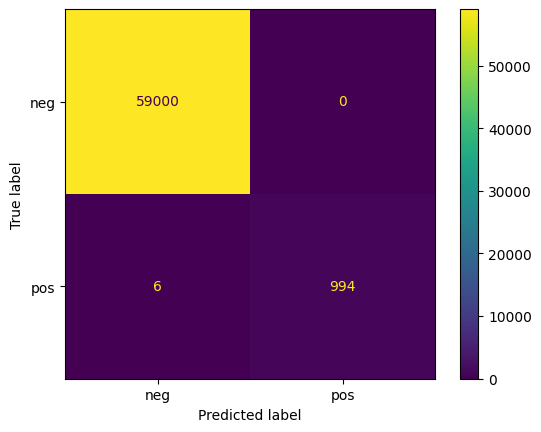

In [95]:
#[18]
xgb_train_cm = sklearn.metrics.confusion_matrix(y_true=train_y, y_pred=xgb_train_predict_y)

#[19]
xgb_train_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=xgb_train_cm, display_labels=["neg", "pos"])
xgb_train_cm_visual.plot()

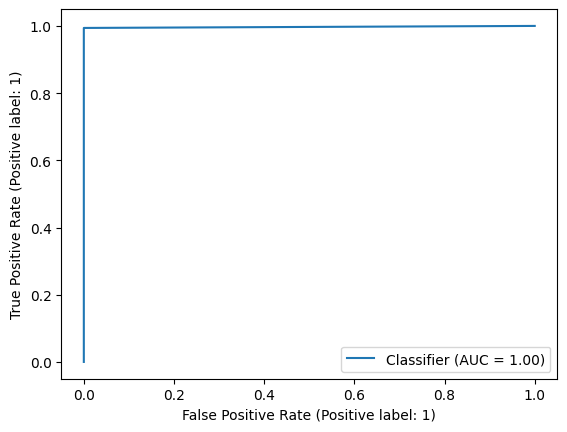

In [96]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=train_y, y_pred=xgb_train_predict_y)
plt.show()

As seen in the graph above, the AUC for the training data is very close to 1.00. (Only 6 misclassifications out of 60,000)

TEST CONFUSION MATRIX, ROC, AUC

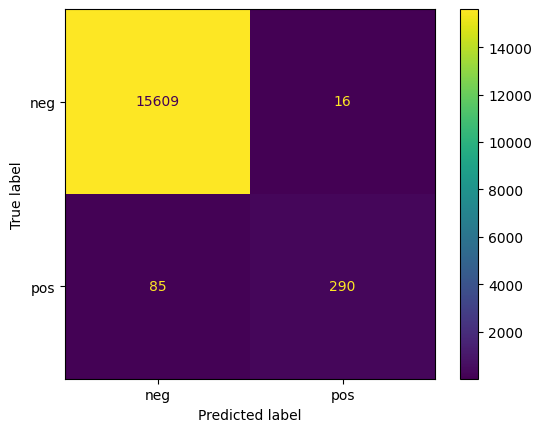

In [97]:
#[18]
xgb_test_cm = sklearn.metrics.confusion_matrix(y_true=test_y, y_pred=xgb_test_predict_y)

#[19]
xgb_test_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=xgb_test_cm, display_labels=["neg", "pos"])
xgb_test_cm_visual.plot()

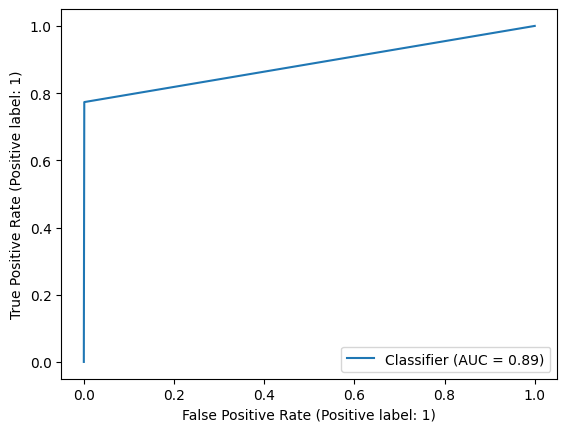

In [98]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=test_y, y_pred=xgb_test_predict_y)
plt.show()

The AUC for the test data is about 0.89.

Comparing the cross-validated predictions of the test error using the trained data, and the actual test error:

Model Error Estimates using Train Data and Cross Validation:
- Five Fold: 0.0054 (0.54%)
- Ten Fold: 0.00541666666 (0.54%)
- Leave One Out: 0.014 (1.4%)

Test Error:
- 101/16000 = 0.0063125 (0.63%)

The actual test error of 0.63% is very close to the CV error estimates for five-fold CV and ten-fold CV (0.54% for both). It was the farthest from the leave one out CV error estimate. The actual test error was a bit higher than 0.54% from five/ten fold CV, but I would say it's still a pretty good estimate. I think leave one out error estimate was much larger because I downsampled the training set for it. That being said, 1.4% is not too far away from the actual test error of 0.63%.

### (f) Use SMOTE to pre-process your data

In [127]:
#[28]
smote_transformer = SMOTE()
smote_train_x, smote_train_y = smote_transformer.fit_resample(train_x, train_y)

In [ ]:
#Possible alpha values:
smote_alpha_values = [1.25, 1.5, 1.75, 2.0, 2.25, 2.5, 2.75]

smote_accuracy_array = []
for this_alpha_value in smote_alpha_values:
    #[24]
    smote_alpha_model = xgb.XGBClassifier(reg_alpha=this_alpha_value)
    #[25]
    smote_alpha_scores = cross_val_score(estimator=smote_alpha_model, X=smote_train_x, y=smote_train_y, cv=5)

    smote_accuracy_array.append(smote_alpha_scores.mean())

print(smote_accuracy_array)
print(np.max(smote_accuracy_array))
print(np.argmax(smote_accuracy_array))

[0.9972881355932204, 0.9972796610169491, 0.9972966101694916, 0.9972881355932202, 0.9972542372881357, 0.9972627118644066, 0.997177966101695]
0.9972966101694916
2


Cross Validation Results:

Alpha - Score

1.25 -- 0.9972881355932204

1.5 -- 0.9972796610169491

1.75 -- 0.9972966101694916

2.0 -- 0.9972881355932202

2.25 -- 0.9972542372881357

2.5 -- 0.9972627118644066

2.75 -- 0.997177966101695

I'm going to choose an alpha value of 1.75, as it had the highest cross validation score.

In [120]:
#[29]
reduced_smote_train_x = pd.concat([smote_train_x.head(1000), smote_train_x.tail(1000)])
reduced_smote_train_y = pd.concat([smote_train_y.head(1000), smote_train_y.tail(1000)])

#[24]
xgb_smote_model = xgb.XGBClassifier(reg_alpha=1.75)
#[25]
xgb_five_cv = cross_val_score(estimator=xgb_smote_model, X=smote_train_x, y=smote_train_y, cv=5)
xgb_ten_cv = cross_val_score(estimator=xgb_smote_model, X=smote_train_x, y=smote_train_y, cv=10)
#[27]
xgb_loo_cv = cross_val_score(estimator=xgb_smote_model, X=reduced_smote_train_x, y=reduced_smote_train_y, cv=LeaveOneOut(), n_jobs=-1)

print("Five k-fold:", xgb_five_cv.mean())
print("Ten k-fold:", xgb_ten_cv.mean())
print("Leave One Out CV:", xgb_loo_cv.mean())

Five k-fold: 0.9972966101694916
Ten k-fold: 0.997406779661017
Leave One Out CV: 0.9715


Train Error Estimates:

Five Fold: 0.00270338983 (0.27%)

Ten Fold: 0.00259322033 (0.26%)

Leave One Out: 0.0285 (2.85%)

In [128]:
#[24]
smote_model_fitted = xgb_smote_model.fit(X=smote_train_x, y=smote_train_y)
smote_train_predict_y = smote_model_fitted.predict(X=smote_train_x)
smote_test_predict_y = smote_model_fitted.predict(X=test_x)

TRAIN CONFUSION MATRIX, ROC, AUC

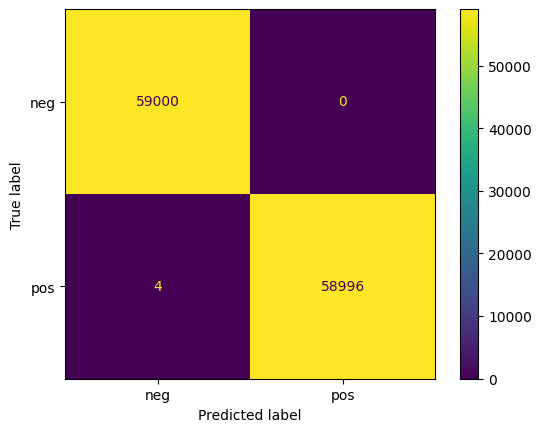

In [129]:
#[18]
smote_train_cm = sklearn.metrics.confusion_matrix(y_true=smote_train_y, y_pred=smote_train_predict_y)

#[19]
smote_train_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=smote_train_cm, display_labels=["neg", "pos"])
smote_train_cm_visual.plot()

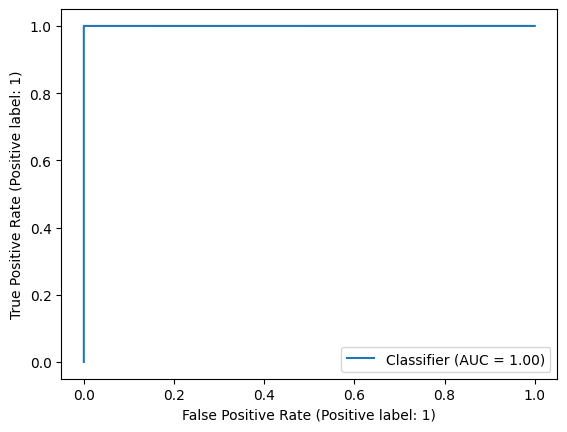

In [130]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=smote_train_y, y_pred=smote_train_predict_y)
plt.show()

As seen in the graph above, the AUC for the training data is very close to 1.00. (Only 3 misclassifications out of 60,000)

TEST CONFUSION MATRIX, ROC, AUC

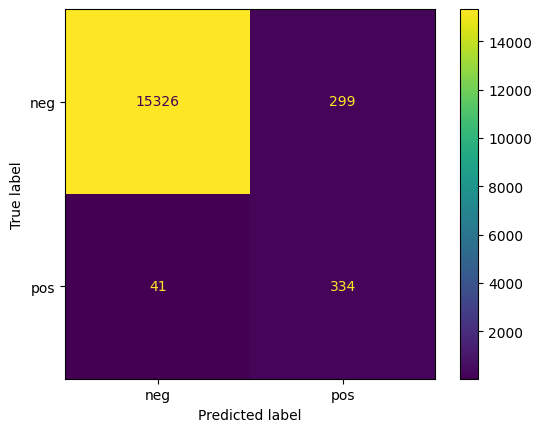

In [131]:
#[18]
smote_test_cm = sklearn.metrics.confusion_matrix(y_true=test_y, y_pred=smote_test_predict_y)

#[19]
smote_test_cm_visual = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix=smote_test_cm, display_labels=["neg", "pos"])
smote_test_cm_visual.plot()

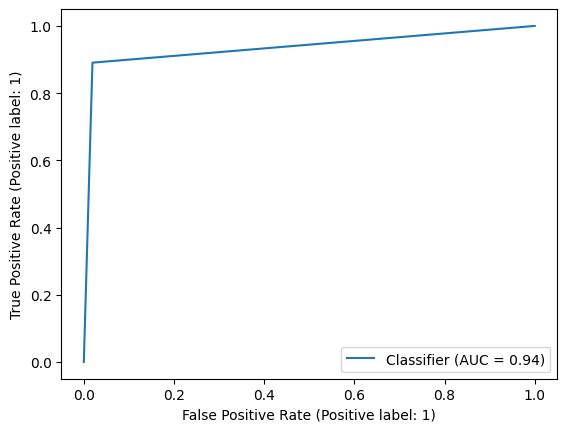

In [132]:
#[21]
sklearn.metrics.RocCurveDisplay.from_predictions(y_true=test_y, y_pred=smote_test_predict_y)
plt.show()

The AUC for the test data is about 0.94.

Comparing the cross-validated predictions of the test error using the trained data, and the actual test error:

Model Error Estimates using Train Data and Cross Validation:
- Five Fold: 0.00270338983 (0.27%)
- Ten Fold: 0.00259322033 (0.26%)
- Leave One Out: 0.0285 (2.85%)

Test Error:
- (41 + 299)/16000 = 0.02125 (2.1%)

The actual test error of 2.1% is very close to the leave one out estimated test error of 2.85%. It was farther away, however, from the five and ten fold cross validation error estimates, which were both below 1.0%.

Comparing the non-balanced model with the balanced SMOTE model, it actually appears that the non-balanced model does better, with an test error of 0.63% as compared to the SMOTE model's test error of 2.1%.

That being said, one area where the SMOTE model is superior to the non-balanced model is that the SMOTE model has significantly less false negatives (only 41) as compared to the non-balanced model (85 false negatives). Thus, if you care about avoiding false negatives, then the SMOTE model might be a more useful model. Conversely, the SMOTE model has much more false positives (299) as compared to the non-balanced model (only 16 false positives). I think the reason why the SMOTE model has so many more false positives was simply because SMOTE significantly increased the number of positive labled/classed datapoints as compared to the non-balanced model. Thus, if you care about avoiding false positives, I would suggest using the non-balanced model instead.

## 2. ISLR 6.6.3

a. Training RSS
- I would say ii. -- training RSS would decrease initially and then eventually start increasing in a U shape. As you modify s, and hence lambda, you're changing how much you should shrink the coefficient estimates by. This could increase or decrease the training RSS of the model, as a model where the coefficient estimates are shrunk by too much could do worse than a model where the coefficient estimates are not shrunk by as much, and a model where the coefficient estimates are shrunk by not too much could do worse than a model where the coefficient estimates are shrunk even more. As such, there's an ideal "s" and "lambda" value where the sum of the squares of the training errors of the model is minimized. This is why you use cross validation to find the value of lambda, to see which value of lambda makes a model that has the lowest training error.

b. Testing RSS
- I would say ii. -- testing RSS would decrease initially and then eventually start increasing in a U shape. My reasoning is the same as for training RSS. Modifying s (and lambda) changes how much you're constraining the coefficient estimates, which can affect the performance of the model. There is bound to be a section where you've constrained too much, and where you've constrained too little, and in between those two sections there should be an optimal point where the sum of squares of the test error is the lowest. Cross validation on the training data helps us estimate what this test error could be.

c. Variance
- I would say iii. -- variance would steadily increase. As you increase s (and decrease lambda), you're restraining the coefficient estimates less and less. This means that there's more of a range of possible values your coefficient estimates could take. This will increase the variance of your coefficient estimates, and your coefficient estimates could become very sensitive to training data. Generally speaking, decresaing lambda and increasing s increases variance.

d. Bias
- I would say iv. -- bias would steadily decrease. Variance and bias are inversely related, so an increase in variance means a decrease in bias as you increase s (and decrease lambda). As you're restraining the coefficient estimates less and less, you're allowing your model to choose a wider selection of possible coefficients to fit the training data. This will decrease the bias. Generally speaking, decreasing lambda and increasing s decreases bias.

e. Irreducible error
- I would say v. -- irreducible error would stay constant. Irreducible data is related to the noise in the training data, and not really to the model you're trying to fit. Modifying s will modify your model, changing how close your model can get from the "ideal model" that represents the actual underlying relationship. But even an "ideal model" cannot be perfect, due to data noise. Thus, while modifying s could help make your model be better, it can't ever really modify the baked in noise in the data -- the irreducible error.

## 3. ISLR 6.6.5

a. 

Initial estimates:

y1_estimate = beta1 * x11 + beta2 * x12
y2_estimate = beta1 * x21 + beta2 * x22

Ridge Regression Optimization: Find beta1 and beta2 that minimizes: 

(y1 - beta1 * x11 - beta2 * x12)^2 + (y2 - beta1 * x21 - beta2 * x22)^2 + (lambda) * (beta1^2 + beta2^2)

b.

As x11 = x12 and x21 = x22, we can rewrite the optimization as (where x1 = x11 = x12 and x2 = x21 = x22):

(y1 - (beta1 + beta2) * x1)^2 + (y2 - (beta1 + beta2) * x2)^2 + (lambda) * (beta1^2 + beta2^2)

If we ignore the shrinking penalty, minimizing just the RSS (the above expression without the shrinking penalty term) means finding the betaX = (beta1 + beta2) that minimizes:

(y1 - betaX * x1)^2 + (y2 - betaX * x2)^2

Thus, in this RSS part, we're trying to find the betaX value that minimizes this part of the expression (the RSS part). At least in this part, it doesn't matter what beta1 and beta2 end up being, as long as they add up to this ideal "betaX" value.

However, while the RSS part of the expression doesn't care about what beta1 and beta2 end up being as long as they sum to betaX, the shrinking penalty part WILL care about the relative value of beta1 and beta2:

(lambda) * (beta1^2 + beta2^2)

Thus, we end up with the problem of what value of beta1 and beta2 minimizes the shrinking penalty above while also still summing to betaX. As we're taking the squared value of the betas, different values of beta1 and beta2, even if beta1 + beta2 = betaX, could result in different values of beta1^2 + beta2^2. (As an example, 1 + 1 = 2 and .5 + 1.5 = 2, but 1^2 + 1^2 = 2 and .5^2 + 1.5^2 = 2.5). Given that a linear increase in beta1 or beta2 results in a quadratic increase in either beta1^2 or beta2^2, we want to make beta1 and beta2 both as small as possible. As it turns out, the only way to do this is by setting beta1 = beta2, with both beta's being excalty one half of the ideal betaX. (.5 * beta1 + .5 * beta2 = betaX). This is the "minimum" point of a 3D parabola where x and y axes are beta1 and beta2, and z is beta1^2 + beta2^2. As this parabola is symmetrical, it makes sense that the minimum point would be the point where beta1 = beta2. Thus, because we need to minimize the shrinking penalty, it turns out that this implies that beta1 must equal to beta2.

c.

Lasso Regression Optimization: Find beta1 and beta2 that minimizes: 

(y1 - beta1 * x11 - beta2 * x12)^2 + (y2 - beta1 * x21 - beta2 * x22)^2 + (lambda) * ( |beta1| + |beta2| )

d.

Similar to above, as x11 = x12 and x21 = x22, we can rewrite the optimization as (where x1 = x11 = x12 and x2 = x21 = x22):

(y1 - (beta1 + beta2) * x1)^2 + (y2 - (beta1 + beta2) * x2)^2 + (lambda) * ( |beta1| + |beta2| )

Again, ignoring the shrinking penalty part, minimizing the RSS (the above expression without the shrinking penalty term) means finding the betaX = (beta1 + beta2) that minimizes:

(y1 - betaX * x1)^2 + (y2 - betaX * x2)^2

Again, for the RSS part, it doesn't matter what beta1 and beta2 end up being as long as they both sum to this ideal betaX.

Unlike, however, for ridge regression, the shrinking penalty also generally does not care what the value of beta1 and beta2 are. This is because the shrinking penalty for lasso regression is:

(lambda) * ( |beta1| + |beta2| )

Thus, here, we want to find beta1 and beta2 such that beta1 + beta2 = betaX and |beta1| + |beta2| is minimized. Note that because of the first condition, |beta1| + |beta2| must be at a minimum betaX. Because there's no squared terms, there can be multiple different possible beta1 and beta2 values that can work. For instance, if betaX = 4, then |beta1| + |beta2| must be at least 4. Thus, (beta1 = 1 and beta2 = 3) and (beta1 = 2 and beta2 = 2) are both solutions that minimizes the shrinking penalty, as they both sum up to 4. In fact, any positive beta1 and beta2 that sum to betaX can be a minimizing solution. Thus, there are many different possible solutions.

Possible solutions:

Any (beta1, beta2) such that beta1 + beta2 = betaX, where betaX is the estimated coefficient that minimizes:

(y1 - betaX * x1)^2 + (y2 - betaX * x2)^2 + (lambda) * ( betaX )

## 4. ISLR 8.4.5

Under majority vote approach:

- 0.1 --> Green

- 0.15 --> Green

- 0.2 --> Green

- 0.2 --> Green

- 0.55 --> Red

- 0.6 --> Red

- 0.6 --> Red

- 0.65 --> Red

- 0.7 --> Red

- 0.75 --> Red

4 Green, 6 Red

Thus, we should classify as Red.

Under Average Probability

Probability Average = (0.1 + 0.15 + 0.2 + 0.2 + 0.55 + 0.6 + 0.6 + 0.65 + 0.7 + 0.75)/ 10

Probability Average = 0.45 < 0.5 --> Green

Thus, we should classify as Green.

## 5. ISLR 9.7.3

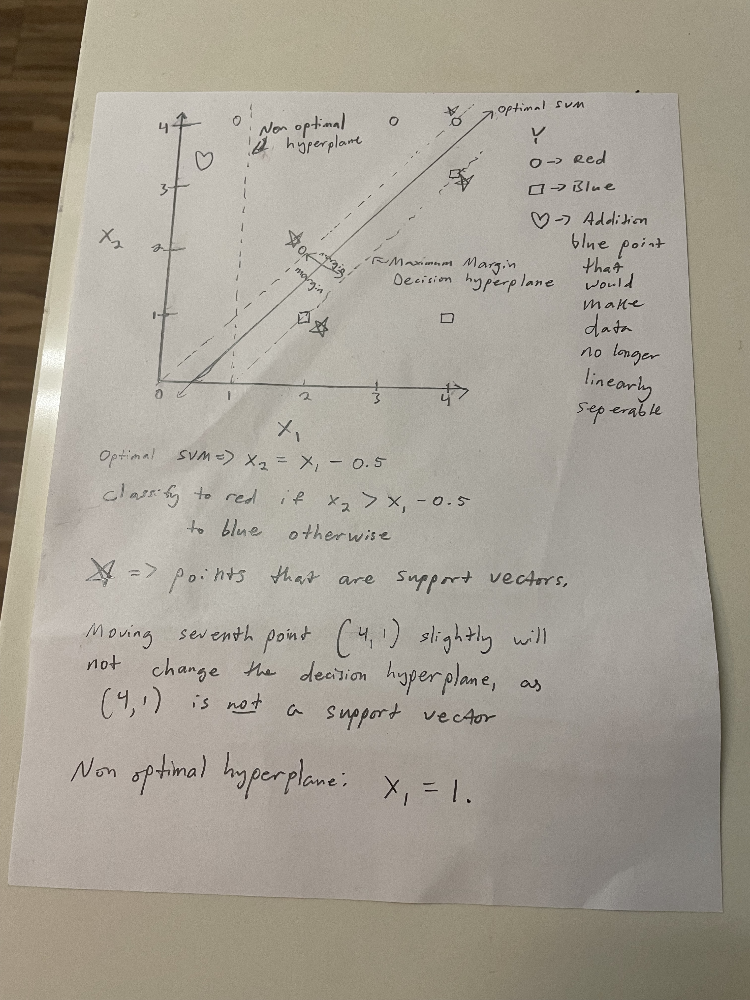

References:

[1] https://pandas.pydata.org/docs/reference/api/pandas.read_excel.html

[2] Lesson 3 Slides 164-169

[3] https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779

[4] https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html

[5] https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.replace.html

[6] https://sparkbyexamples.com/pandas/pandas-convert-string-to-float-type-dataframe/

[7] https://pandas.pydata.org/docs/user_guide/missing_data.html

[8] https://www.statology.org/coefficient-of-variation-in-python/

[9] https://numpy.org/doc/stable/reference/generated/numpy.std.html

[10] https://www.geeksforgeeks.org/how-to-create-a-correlation-matrix-using-pandas/#

[11] https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.to_excel.html

[12] https://seaborn.pydata.org/examples/many_pairwise_correlations.html

[13] https://pandas.pydata.org/pandas-docs/version/0.17.0/generated/pandas.DataFrame.nlargest.html

[14] https://seaborn.pydata.org/generated/seaborn.pairplot.html

[15] https://seaborn.pydata.org/generated/seaborn.boxplot.html

[16] https://www.geeksforgeeks.org/how-to-count-occurrences-of-specific-value-in-pandas-column/#

[17] https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html

[18] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html

[19] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html#sklearn.metrics.ConfusionMatrixDisplay

[20] https://www.geeksforgeeks.org/how-to-replace-values-in-column-based-on-condition-in-pandas/

[21] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html#sklearn.metrics.RocCurveDisplay.from_predictions

[22] https://scikit-learn.org/stable/modules/generated/sklearn.metrics.auc.html

[23] https://machinelearningmastery.com/bagging-and-random-forest-for-imbalanced-classification/

[24] https://xgboost.readthedocs.io/en/stable/python/python_api.html#module-xgboost.sklearn

[25] https://scikit-learn.org/stable/modules/cross_validation.html

[26] https://www.geeksforgeeks.org/how-to-randomly-select-rows-from-pandas-dataframe/#

[27] https://www.statology.org/leave-one-out-cross-validation-in-python/

[28] https://machinelearningmastery.com/smote-oversampling-for-imbalanced-classification/

[29] https://pandas.pydata.org/docs/user_guide/merging.html